#Installing Requirements

##Cloning YOLOv5 from git and installing dependencies

In [ ]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
%pip install -qr requirements.txt
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 16057, done.
remote: Total 16057 (delta 0), reused 0 (delta 0), pack-reused 16057
Receiving objects: 100% (16057/16057), 14.60 MiB | 28.97 MiB/s, done.
Resolving deltas: 100% (11032/11032), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.6/190.6 kB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 18.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 645.2/645.2 kB 29.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.9 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
imageio 2.31.6 requires pillow<10.1.0,>=8.3.2, but you have pillow 10.1.0 which is incompatible.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.3/63.3 kB 2.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 

##Installing Roboflow to import the augmented dataset.

In [ ]:
!pip install roboflow

In [ ]:
from roboflow import Roboflow
os.environ["DATASET_DIRECTORY"] = "/content/datasets"
rf = Roboflow(api_key="vftys1pnN2w8wiKHPshs")
project = rf.workspace("devashish-workspace").project("pothole-detection-2-28w0d")
dataset = project.version(2).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to /content/datasets/Pothole-Detection-2-2 in yolov5pytorch:: 100%|██████████| 3202/3202 [00:00<00:00, 5173.40it/s]


#Training the model

In [ ]:
!python train.py --img 640 --batch 16 --epochs 100 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

2023-11-04 09:42:27.457682: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-04 09:42:27.457737: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-04 09:42:27.457778: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=/content/datasets/Pothole-Detection-2-2/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=S

#Evaluating the model on the test set

##Applying the detection

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 640 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/Pothole-Detection-2-2/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-235-g6ca8f33 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/67 /content/datasets/Pothole-Detection-2-2/test/images/potholes117_png.rf.d4446805a12b1341b3438642f39870c0.jpg: 640x640 2 potholes, 11.4ms
image 2/67 /content/datasets/Pothole-Detection-2-2/test/images/potholes120_png.rf.8c62054e7fad8408a3c612ddf1f29c64.jpg: 640x640 5 potholes, 11.5ms
image

##Displaying the test set images with detected potholes

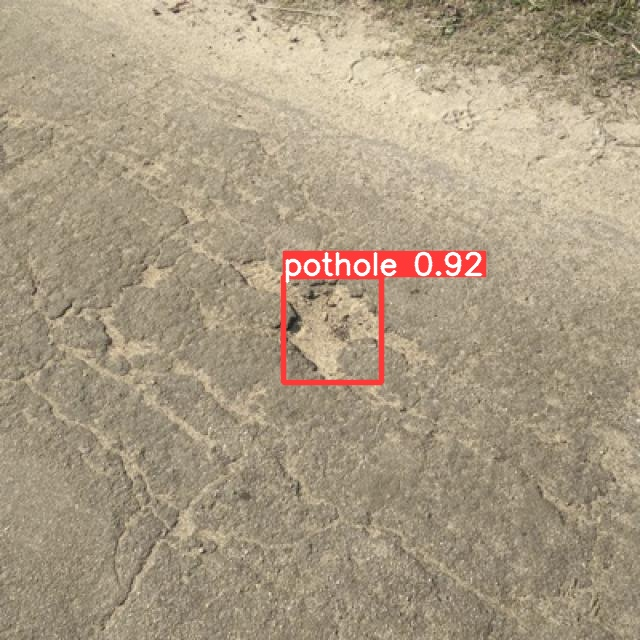

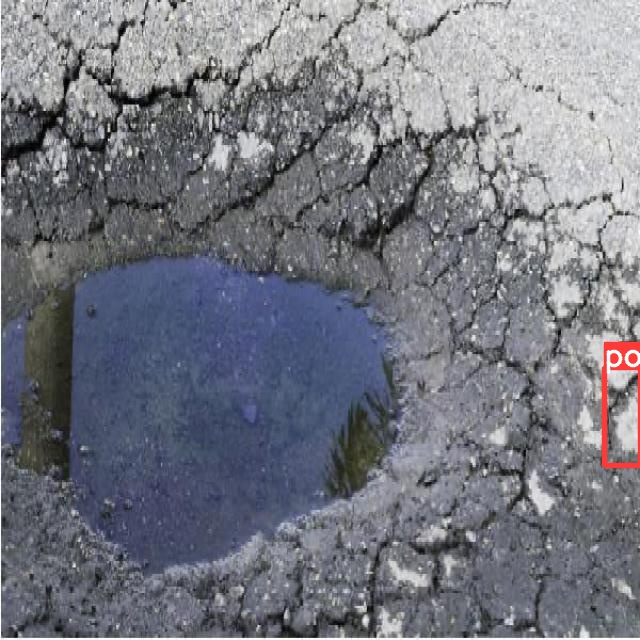

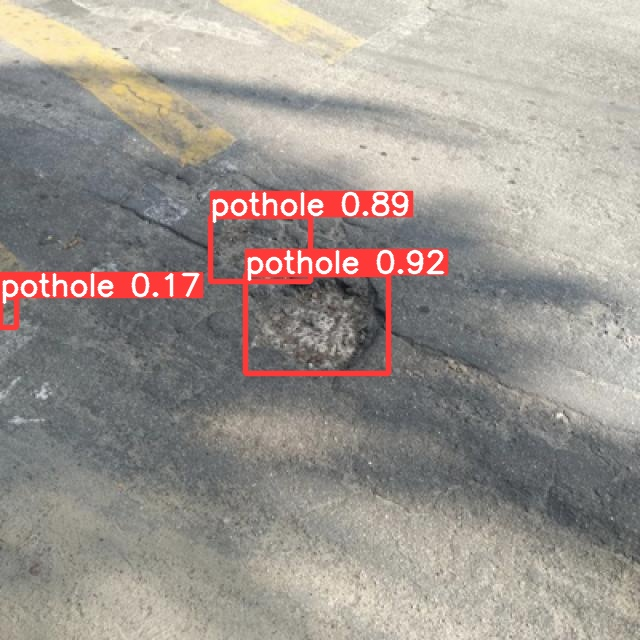

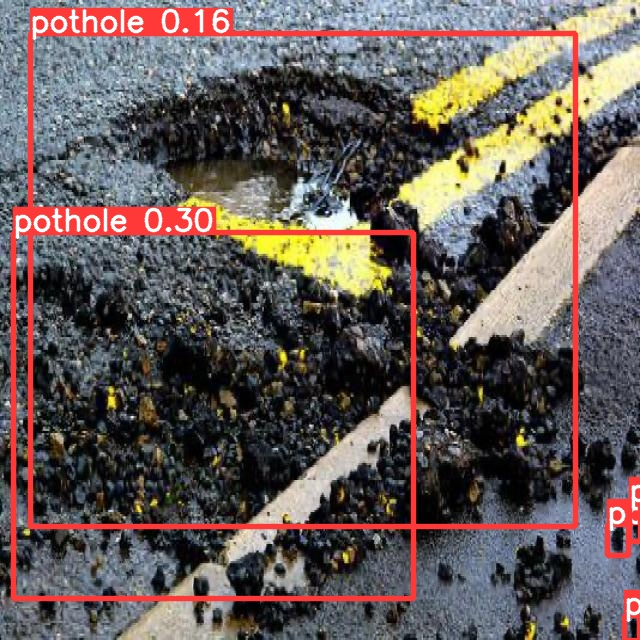

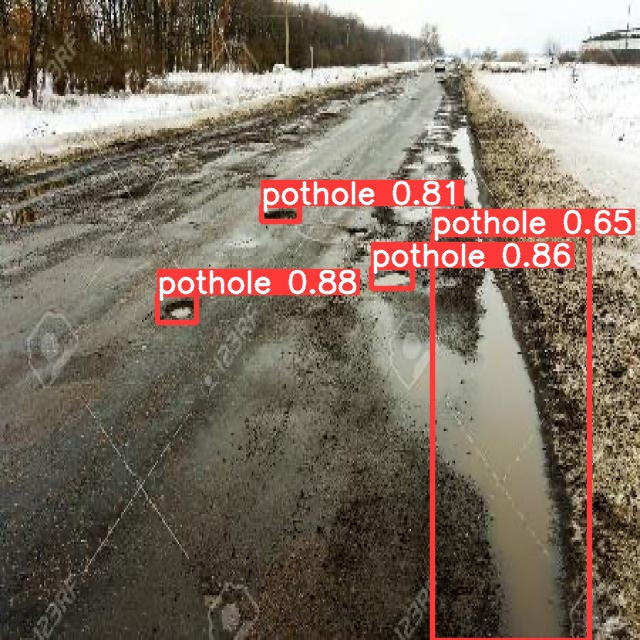

...

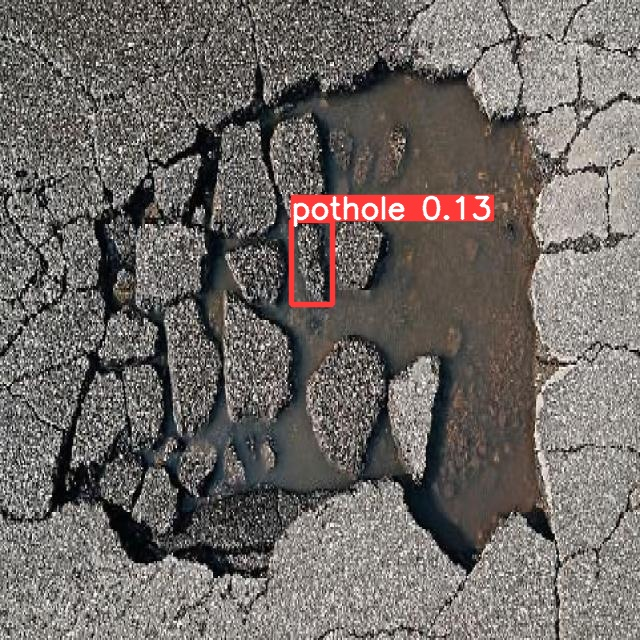

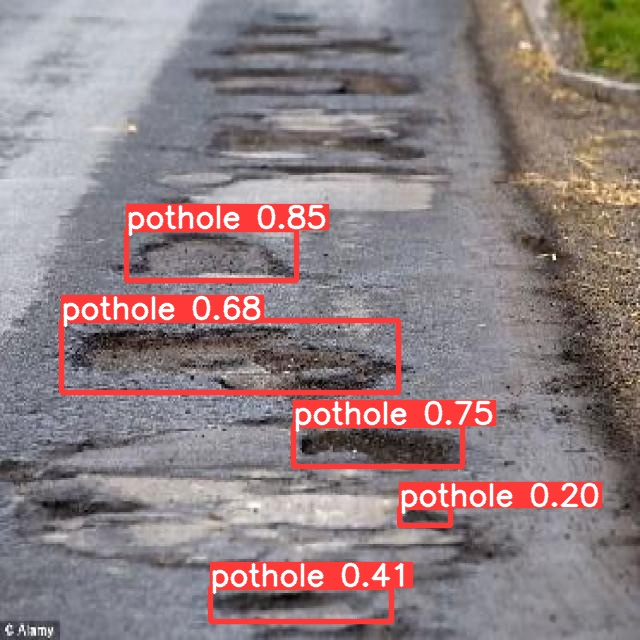

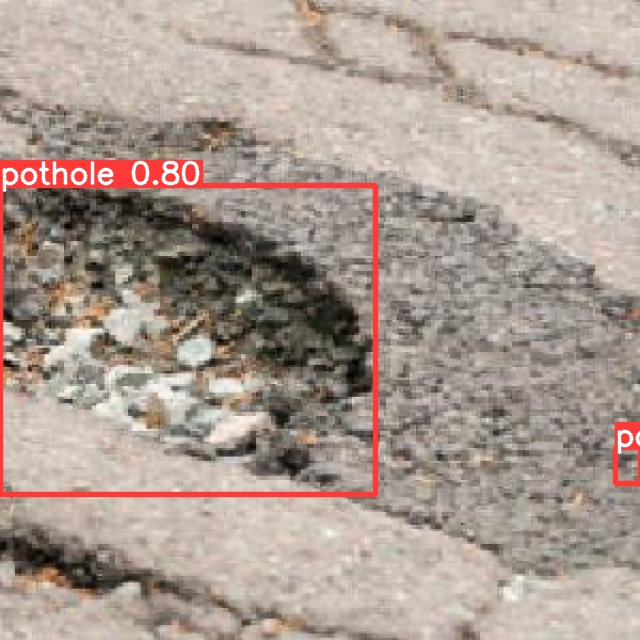

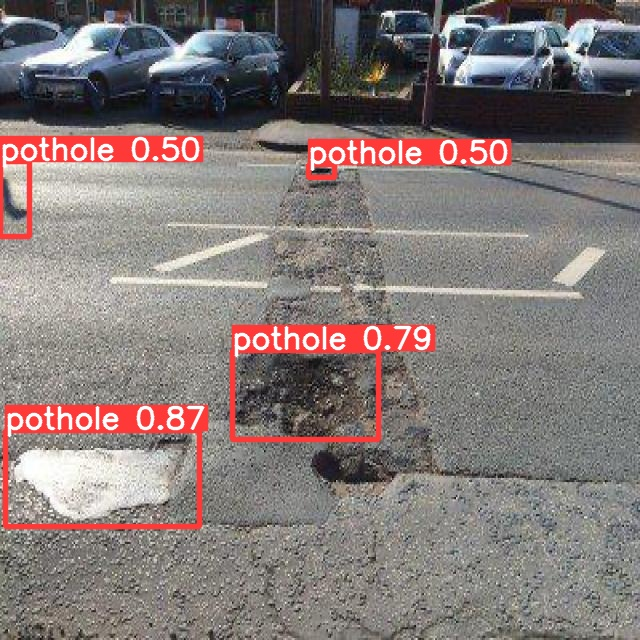

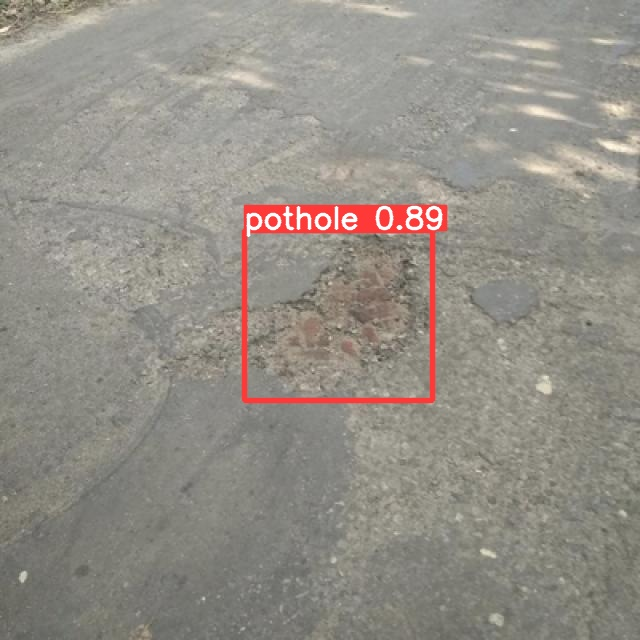

In [ ]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

#Exporting the trained weights and downloading the results

In [ ]:
from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
!zip -r results.zip ./runs/train/exp
files.download('results.zip')

  adding: runs/train/exp/ (stored 0%)
  adding: runs/train/exp/val_batch2_labels.jpg (deflated 6%)
  adding: runs/train/exp/val_batch0_labels.jpg (deflated 5%)
  adding: runs/train/exp/val_batch0_pred.jpg (deflated 5%)
  adding: runs/train/exp/R_curve.png (deflated 16%)
  adding: runs/train/exp/opt.yaml (deflated 48%)
  adding: runs/train/exp/events.out.tfevents.1699090950.754e388c0ee0.2232.0 (deflated 41%)
  adding: runs/train/exp/val_batch2_pred.jpg (deflated 6%)
  adding: runs/train/exp/train_batch0.jpg (deflated 1%)
  adding: runs/train/exp/hyp.yaml (deflated 45%)
  adding: runs/train/exp/train_batch1.jpg (deflated 1%)
  adding: runs/train/exp/F1_curve.png (deflated 17%)
  adding: runs/train/exp/val_batch1_pred.jpg (deflated 5%)
  adding: runs/train/exp/confusion_matrix.png (deflated 38%)
  adding: runs/train/exp/val_batch1_labels.jpg (deflated 5%)
  adding: runs/train/exp/labels.jpg (deflated 25%)
  adding: runs/train/exp/train_batch2.jpg (deflated 1%)
  adding: runs/train/exp/res

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Running the evaluation on the image downloaded from internet

##Uploading the image

In [ ]:
files.upload()
pass

Saving many_potholes_jpg (1).jpg to many_potholes_jpg (1).jpg


##Importing relevant libraries

In [ ]:
import torch
from pathlib import Path
from models.experimental import attempt_load
from utils.general import non_max_suppression, xyxy2xywh
from utils.torch_utils import select_device
from PIL import Image
weight_path=Path('./runs/train/exp/weights/best.pt')


##Evaluation

In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="vftys1pnN2w8wiKHPshs")
project = rf.workspace("devashish-workspace").project("pothole-detection-2-28w0d")
version = project.version(1)
version.deploy("yolov5", "./runs/train/exp/")

loading Roboflow workspace...
loading Roboflow project...
View the status of your deployment at: https://app.roboflow.com/devashish-workspace/pothole-detection-2-28w0d/1
Share your model with the world at: https://universe.roboflow.com/devashish-workspace/pothole-detection-2-28w0d/model/1


##Output

In [ ]:
model = project.version(1).model
print(model.predict("many_potholes_jpg (1).jpg", confidence=40, overlap=30).json())
model.predict("many_potholes_jpg (1).jpg", confidence=40, overlap=30).save("img_yolo.jpg")
#The default roboflow doesn't save from Colab. I have made a python code for the same.

{'predictions': [{'x': 381.0, 'y': 358.0, 'width': 74.0, 'height': 50.0, 'confidence': 0.9164608120918274, 'class': 'pothole', 'class_id': 0, 'image_path': 'many_potholes_jpg (1).jpg', 'prediction_type': 'ObjectDetectionModel'}, {'x': 411.5, 'y': 434.5, 'width': 73.0, 'height': 61.0, 'confidence': 0.9161425828933716, 'class': 'pothole', 'class_id': 0, 'image_path': 'many_potholes_jpg (1).jpg', 'prediction_type': 'ObjectDetectionModel'}, {'x': 320.5, 'y': 423.0, 'width': 61.0, 'height': 62.0, 'confidence': 0.9147081971168518, 'class': 'pothole', 'class_id': 0, 'image_path': 'many_potholes_jpg (1).jpg', 'prediction_type': 'ObjectDetectionModel'}, {'x': 236.0, 'y': 325.0, 'width': 90.0, 'height': 60.0, 'confidence': 0.9136596918106079, 'class': 'pothole', 'class_id': 0, 'image_path': 'many_potholes_jpg (1).jpg', 'prediction_type': 'ObjectDetectionModel'}, {'x': 465.5, 'y': 523.5, 'width': 111.0, 'height': 87.0, 'confidence': 0.8972306251525879, 'class': 'pothole', 'class_id': 0, 'image_pa